In [2]:
import numpy as np
import scipy.ndimage as nd
import pylab as pl
%pylab inline

/Users/ianstuart/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


Populating the interactive namespace from numpy and matplotlib


In [3]:
img = nd.imread('skynet-data/data/images/15-9627-12344.png')

In [4]:
img.shape

(256, 256, 3)

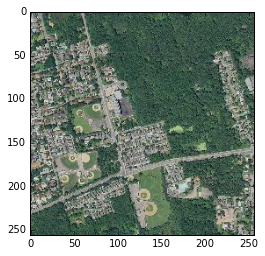

In [5]:
imshow(img)

In [1]:
# fig = pl.figure()
# fig.add_subplot(131)
# # the red channel
# pl.imshow(img[:,:,0], cmap="gray")
# fig.add_subplot(132)
# # the green channel
# pl.imshow(img[:,:,1], cmap="gray")
# fig.add_subplot(133)
# # the blue channel
# fig.add_subplot(133)
# pl.imshow(img[:,:,2], cmap="gray")

In [8]:
from skimage import exposure
from skimage import segmentation as sg

In [10]:
img = 1.0 * img
img = exposure.rescale_intensity(img, out_range=(0.0,1.0))

In [11]:
img[0]

array([[ 0.        ,  0.09803922,  0.        ],
       [ 0.76862745,  0.86666667,  0.78039216],
       [ 0.20784314,  0.29019608,  0.22352941],
       [ 0.41960784,  0.49019608,  0.44313725],
       [ 0.65098039,  0.70196078,  0.6745098 ],
       [ 0.25882353,  0.29411765,  0.2745098 ],
       [ 0.48235294,  0.50588235,  0.49019608],
       [ 0.36078431,  0.38039216,  0.35686275],
       [ 0.35686275,  0.38039216,  0.34117647],
       [ 0.56470588,  0.58823529,  0.54117647],
       [ 0.54509804,  0.57647059,  0.51764706],
       [ 0.56470588,  0.60784314,  0.55294118],
       [ 0.66666667,  0.71764706,  0.67843137],
       [ 0.29019608,  0.34901961,  0.32156863],
       [ 0.34901961,  0.41176471,  0.4       ],
       [ 0.05882353,  0.13333333,  0.1254902 ],
       [ 0.26666667,  0.39215686,  0.33333333],
       [ 0.08627451,  0.20784314,  0.14509804],
       [ 0.25490196,  0.34901961,  0.28627451],
       [ 0.29803922,  0.36470588,  0.30196078],
       [ 0.69803922,  0.74117647,  0.678

In [14]:
# clusters = sg.slic(img, n_segments=100)
# clusters

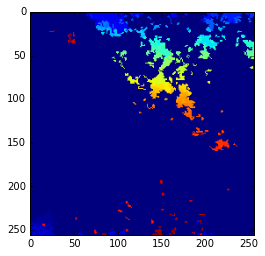

In [34]:
imshow(sg.felzenszwalb(img, scale=8.0, sigma=1, min_size=5))

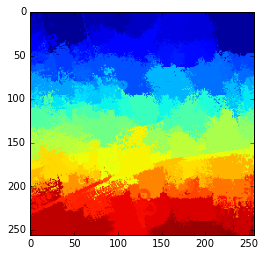

In [35]:
imshow(sg.quickshift(img))

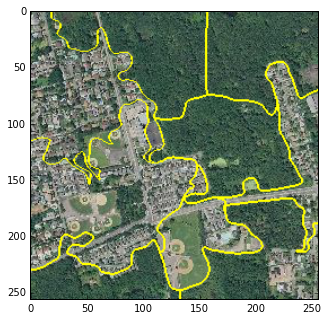

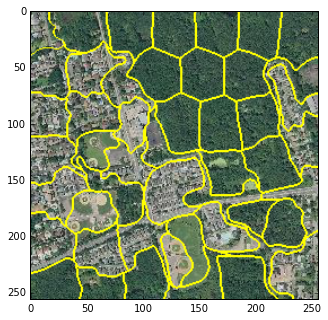

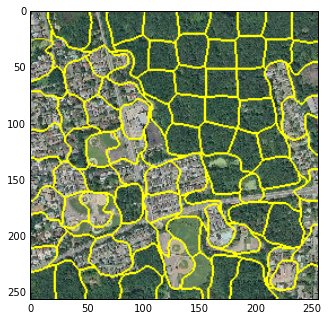

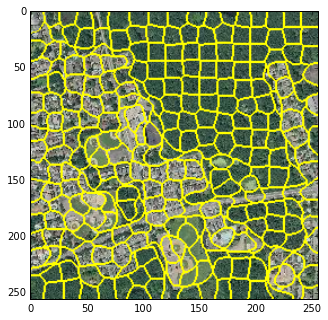

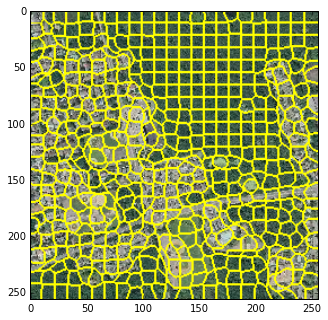

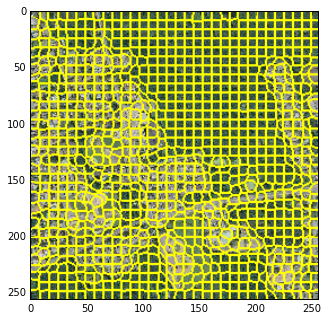

In [38]:
for segs in (10, 50, 100, 300, 500, 1000):
    segments = sg.slic(img, n_segments = segs, sigma = 4)
    fig = plt.figure(figsize=(12,4))
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(sg.mark_boundaries(img, segments)) 
plt.show()

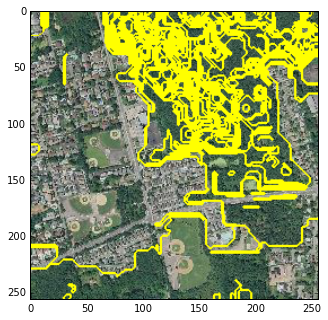

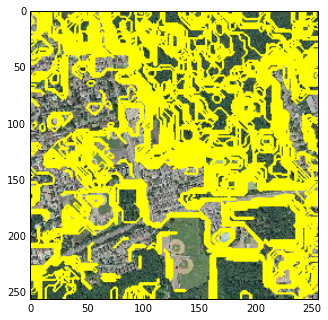

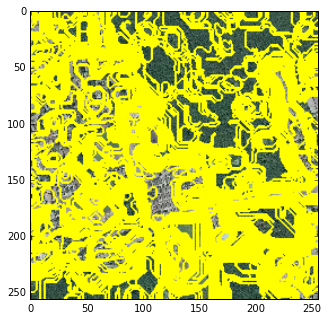

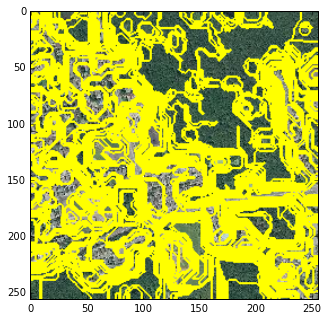

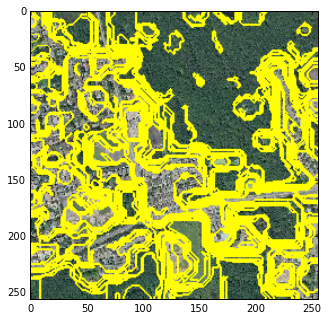

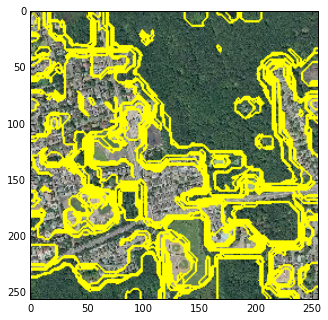

In [41]:
for scale in (1, 2, 4, 8, 16, 32):
    segments = sg.felzenszwalb(img, scale = scale, sigma = 4, min_size = 10)
    fig = plt.figure(figsize=(12,4))
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(sg.mark_boundaries(img, segments)) 
plt.show()

Felzenszwalb's number of segments: 1
Slic number of segments: 230
Quickshift number of segments: 551


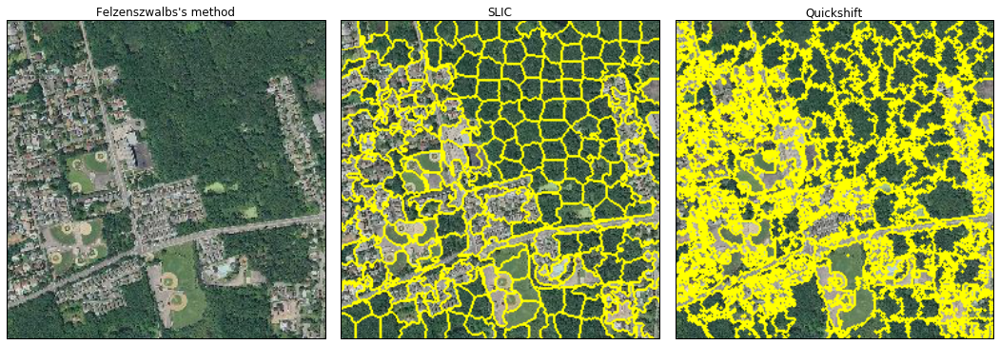

In [43]:
from __future__ import print_function

import matplotlib.pyplot as plt
import numpy as np

from skimage.data import astronaut
from skimage.segmentation import felzenszwalb, slic, quickshift
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=10, sigma=1)
segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)

print("Felzenszwalb's number of segments: %d" % len(np.unique(segments_fz)))
print("Slic number of segments: %d" % len(np.unique(segments_slic)))
print("Quickshift number of segments: %d" % len(np.unique(segments_quick)))

fig, ax = plt.subplots(1, 3)
fig.set_size_inches(16, 8, forward=True)
fig.subplots_adjust(0.05, 0.05, 0.95, 0.95, 0.05, 0.05)

ax[0].imshow(mark_boundaries(img, segments_fz))
ax[0].set_title("Felzenszwalbs's method")
ax[1].imshow(mark_boundaries(img, segments_slic))
ax[1].set_title("SLIC")
ax[2].imshow(mark_boundaries(img, segments_quick))
ax[2].set_title("Quickshift")
for a in ax:
    a.set_xticks(())
    a.set_yticks(())
plt.show()

# Felzenszwalb's number of segments: 2879
# Slic number of segments: 247
# Quickshift number of segments: 1852

In [44]:
img2 = nd.imread('skynet-data/data/images/15-9637-12292.png')

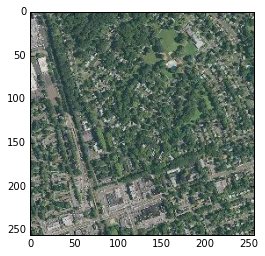

In [46]:
imshow(img2)

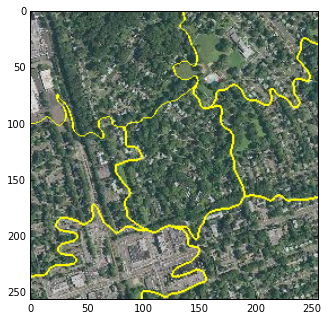

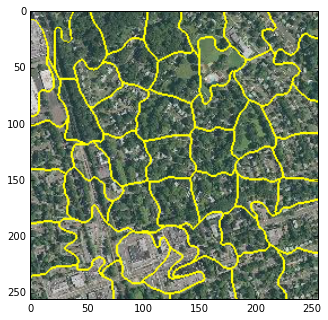

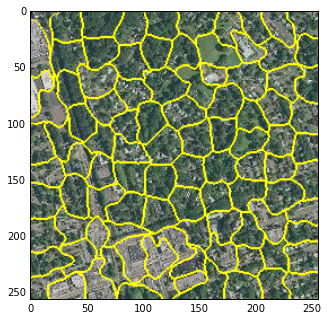

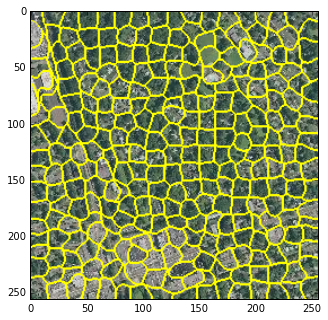

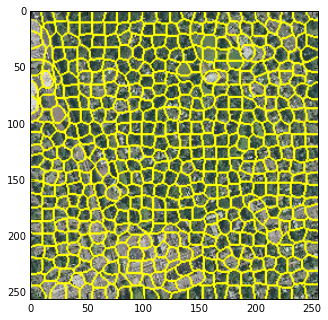

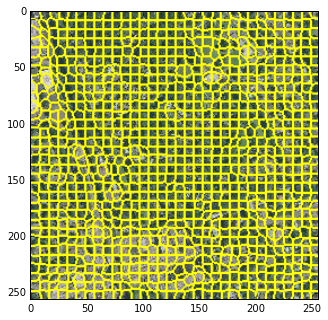

In [47]:
for segs in (10, 50, 100, 300, 500, 1000):
    segments = sg.slic(img2, n_segments = segs, sigma = 4)
    fig = plt.figure(figsize=(12,4))
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(sg.mark_boundaries(img2, segments)) 

In [64]:
img_names = ['15-9627-12344','15-9637-12292','15-9652-12295','15-9654-12335']

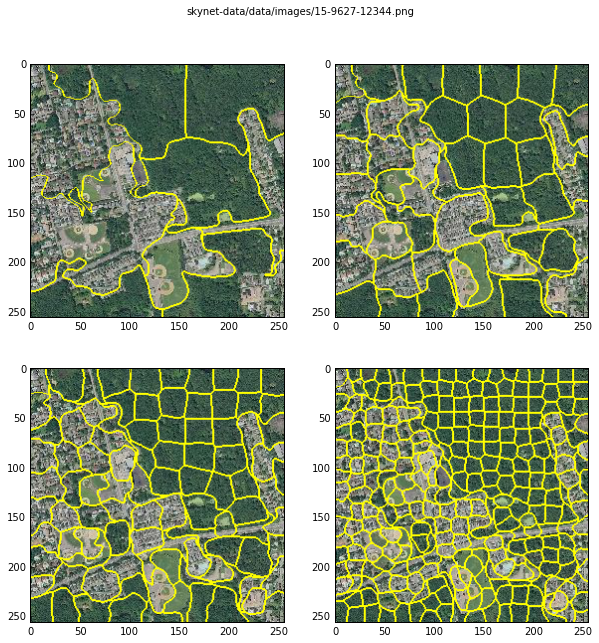

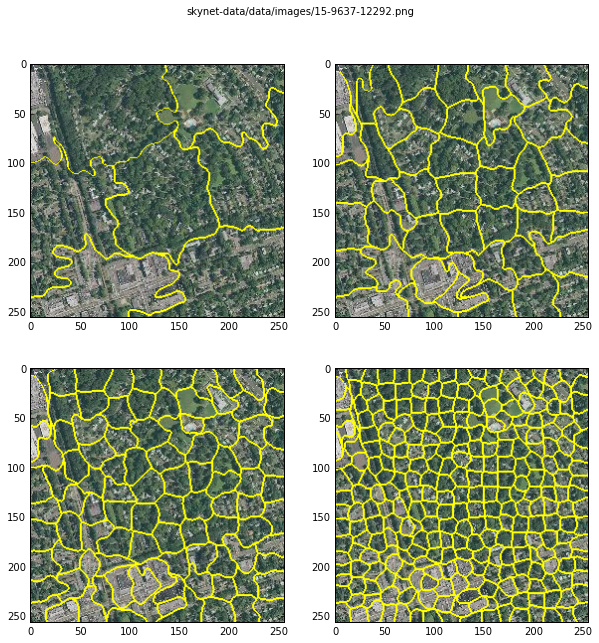

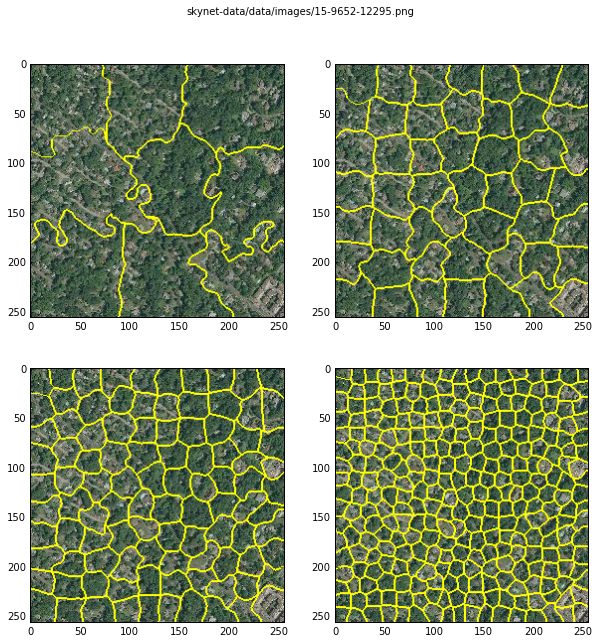

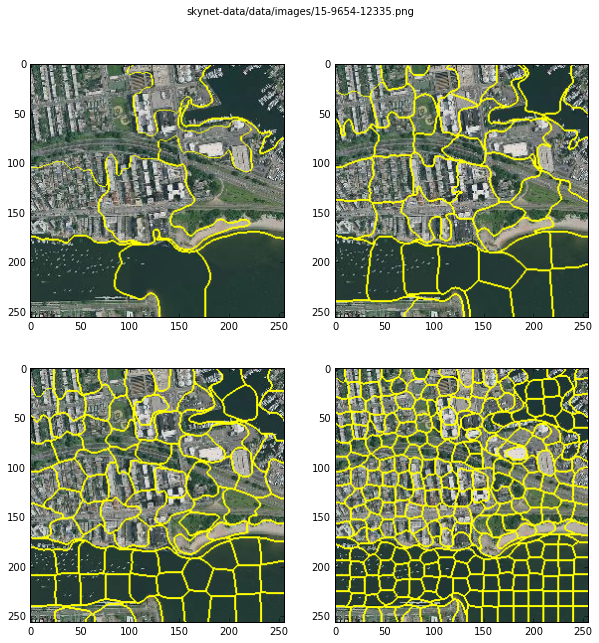

In [72]:
path = 'skynet-data/data/images/{image}.png'

for img in img_names:
    img_path = path.format(img = img)
    img = nd.imread(img_path)
    
    fig = plt.figure(figsize=(10,10))
    subplot = 221
    fig.suptitle(img_path)
    
    for segs in (10, 50, 100, 300):
        segments = sg.slic(img, n_segments = segs, sigma = 4)
        ax = fig.add_subplot(subplot)
        ax.imshow(sg.mark_boundaries(img, segments))
        subplot += 1     


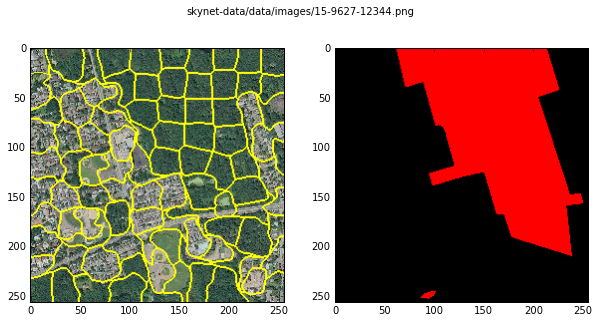

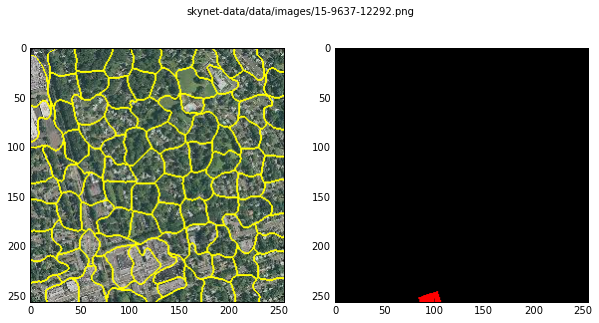

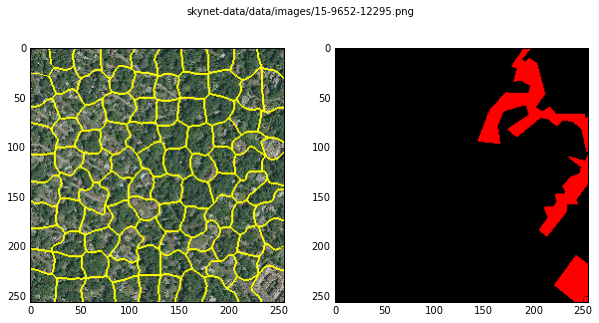

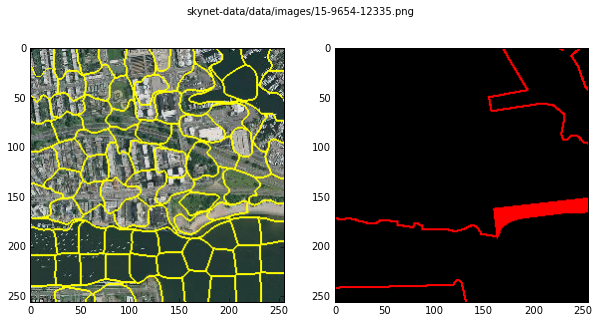

In [103]:
img_path_template = 'skynet-data/data/images/{img}.png'
label_path_template = 'skynet-data/data/labels/color/{label}.png'

for img in img_names:
    img_path = img_path_template.format(img = img)
    image = nd.imread(img_path)
    label_path = label_path_template.format(label = img)
    labels = nd.imread(label_path)    

    fig = plt.figure(figsize=(10,5))
    subplot = 121
    fig.suptitle(img_path)
    
    segments = sg.slic(image, n_segments = 100, sigma = 4)
    ax = fig.add_subplot(subplot)
    ax.imshow(sg.mark_boundaries(image, segments))
    subplot += 1

    ax = fig.add_subplot(subplot)
    ax.imshow(labels)

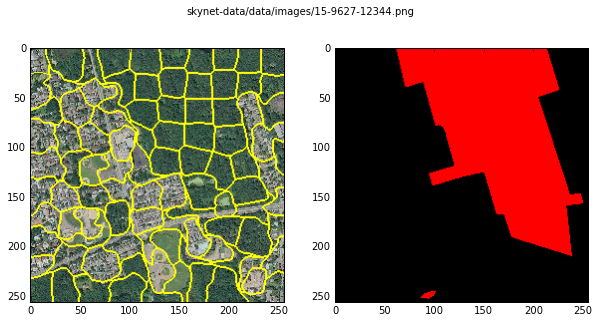

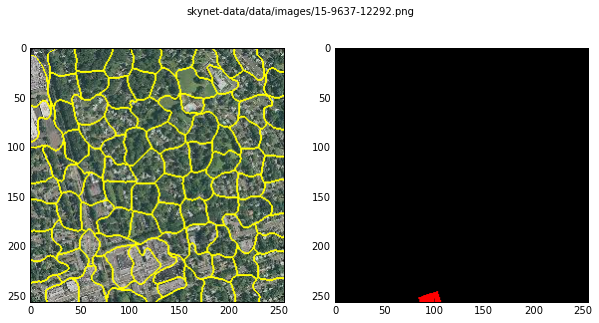

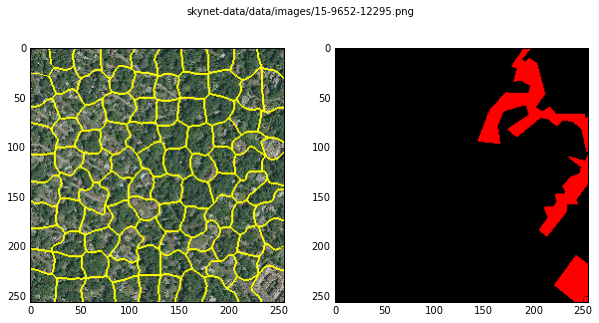

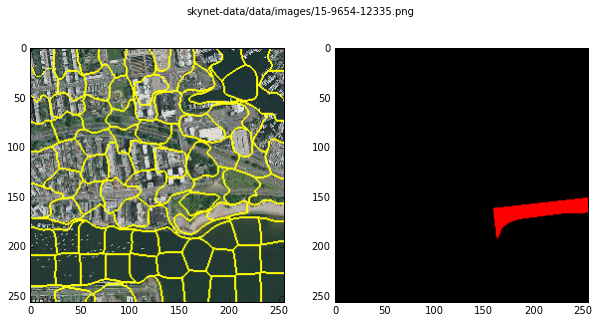

In [105]:
img_path_template = 'skynet-data/data/images/{img}.png'
label_path_template = 'skynet-data/data/labels/color/{label}.png'

for img in img_names:
    img_path = img_path_template.format(img = img)
    image = nd.imread(img_path)
    label_path = label_path_template.format(label = img)
    labels = nd.imread(label_path)    

    fig = plt.figure(figsize=(10,5))
    subplot = 121
    fig.suptitle(img_path)
    
    segments = sg.slic(image, n_segments = 100, sigma = 4)
    ax = fig.add_subplot(subplot)
    ax.imshow(sg.mark_boundaries(image, segments))
    subplot += 1

    ax = fig.add_subplot(subplot)
    ax.imshow(labels)

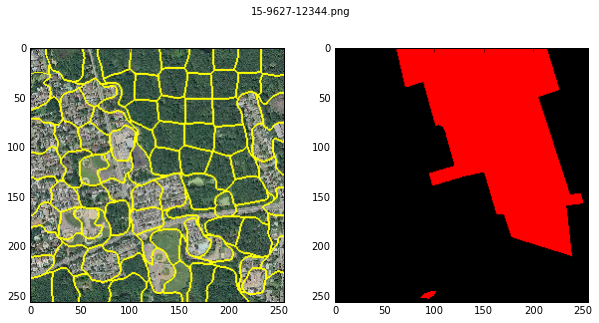

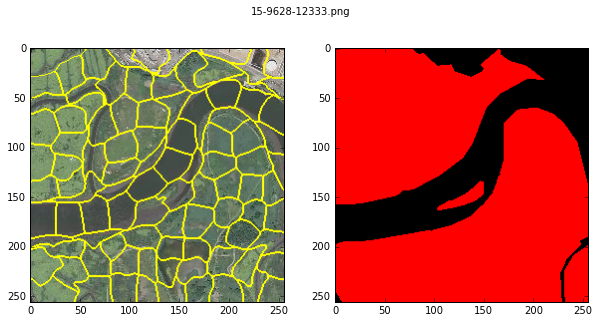

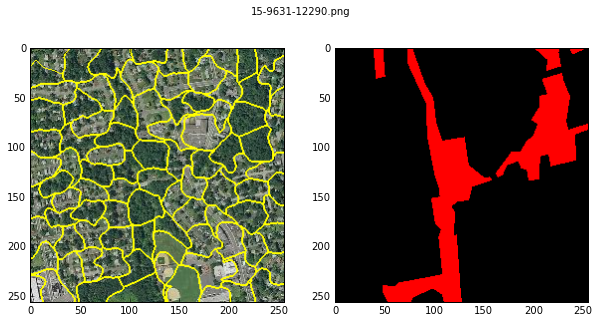

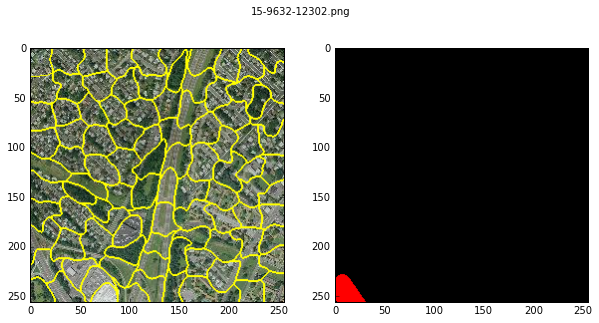

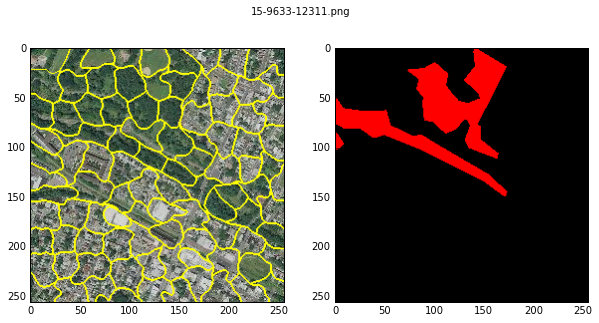

...

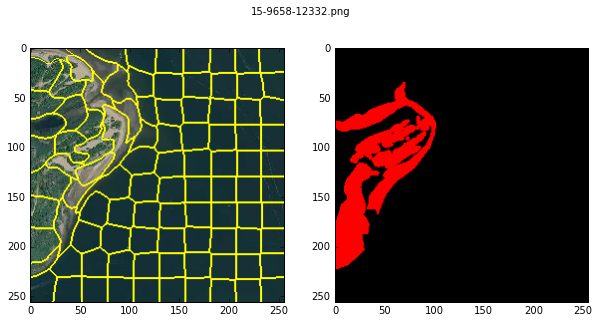

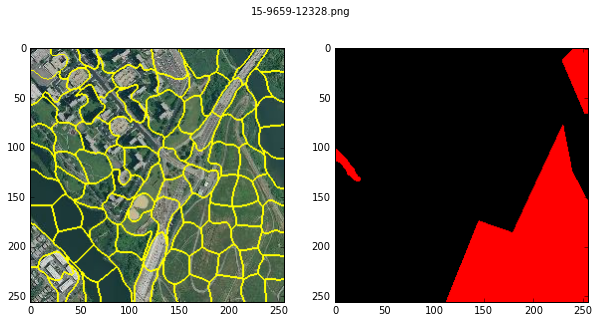

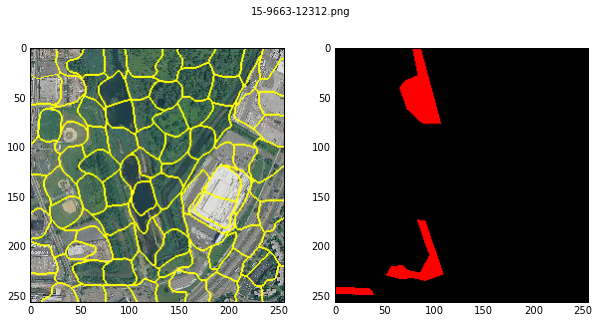

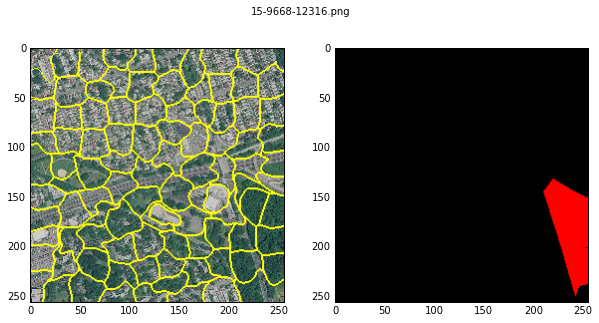

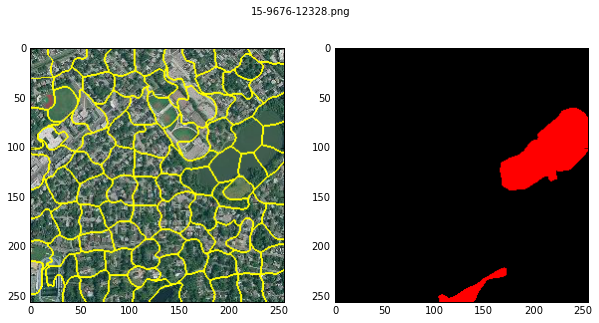

In [113]:
import os

img_path = 'skynet-data/data/images/'
label_path = 'skynet-data/data/labels/color/'

images = os.listdir(img_path)
labels = os.listdir(label_path)

for l in range(len(labels)):
    label = label_path + labels[l]
    label = nd.imread(label)    
    
    for i in range(len(images)):
        if images[i] == labels[l]:
            img = img_path + images[i]
            image = nd.imread(img)

            fig = plt.figure(figsize=(10,5))
            subplot = 121
            fig.suptitle(images[i])

            segments = sg.slic(image, n_segments = 100, sigma = 4)
            ax = fig.add_subplot(subplot)
            ax.imshow(sg.mark_boundaries(image, segments))
            subplot += 1

            ax = fig.add_subplot(subplot)
            ax.imshow(label)

## Extracting segment features using descriptive statistics for each segment

In [465]:
sample_labels_path = 'skynet-data/data/labels/color/15-9627-12344.png'
sample_labels = nd.imread(sample_labels_path)

# classes = np.unique(sample_labels)[1:]  # 0 doesn't count
classes = np.unique(sample_labels)

classes

array([  0, 255], dtype=uint8)

1849


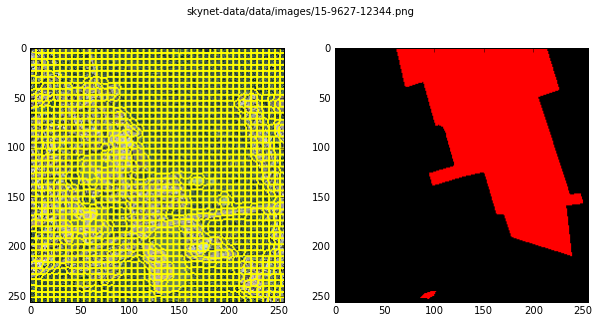

In [466]:
img_path_template = 'skynet-data/data/images/{img}.png'
label_path_template = 'skynet-data/data/labels/color/{label}.png'

for img in img_names:
    img_path = img_path_template.format(img = img)
    image = nd.imread(img_path)
    label_path = label_path_template.format(label = img)
    labels = nd.imread(label_path)    

    fig = plt.figure(figsize=(10,5))
    subplot = 121
    fig.suptitle(img_path)
    
    segments = sg.slic(image, n_segments = 2000, sigma = 4)
    ax = fig.add_subplot(subplot)
    ax.imshow(sg.mark_boundaries(image, segments))
    subplot += 1

    ax = fig.add_subplot(subplot)
    ax.imshow(labels)
    break
    
n_segments = len(np.unique(segments))
print(n_segments)

1849


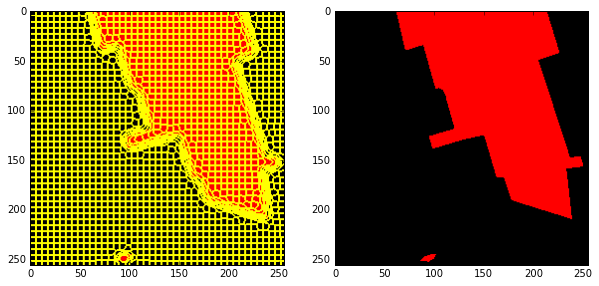

In [426]:
# img_path_template = 'skynet-data/data/images/{img}.png'
# label_path_template = 'skynet-data/data/labels/color/{label}.png'
label_path_template = 'skynet-data/data/labels/color/15-9627-12344.png'


# for img in img_names:
# img_path = img_path_template.format(img = img)
image = nd.imread(label_path_template)
# label_path = label_path_template.format(label = img)
labels = nd.imread(label_path_template)    

fig = plt.figure(figsize=(10,5))
subplot = 121
# fig.suptitle(img_path)

segments = sg.slic(image, n_segments = 2000, sigma = 4)
ax = fig.add_subplot(subplot)
ax.imshow(sg.mark_boundaries(image, segments))
subplot += 1

ax = fig.add_subplot(subplot)
ax.imshow(labels)
    
n_segments = len(np.unique(segments))
print(n_segments)

In [387]:
#### somehow use multiple images...

####################################################

# img_path = 'skynet-data/data/images/'

# # img_path_template = 'skynet-data/data/images/{img}.png'
# label_path_template = 'skynet-data/data/labels/color/{label}'

# images = os.listdir(img_path)
# # images


# # segments = []
# all_images = []
# all_labels = []

# for img in images:
#     image = nd.imread(img_path + img)
#     label_path = label_path_template.format(label = img)
#     labels = nd.imread(label_path)
    
#     all_images.append(image)
#     all_labels.append(labels)

# #     fig = plt.figure(figsize=(10,5))
# #     subplot = 121
# #     fig.suptitle(img_path)
    
# # segments = sg.slic(image, n_segments = 300, sigma = 4)

# all_images.shape

# # segments.append(img_segments)
    
    
# #     ax = fig.add_subplot(subplot)
# #     ax.imshow(sg.mark_boundaries(image, segments))
# #     subplot += 1

# #     ax = fig.add_subplot(subplot)
# #     ax.imshow(labels)
    
# # len(segments)
# # n_segments = len(np.unique(segments))
# # print(n_segments)

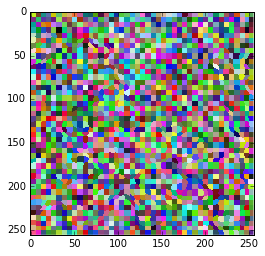

In [467]:
from matplotlib import colors

cmap = colors.ListedColormap(np.random.rand(n_segments, 3))
plt.figure()
plt.imshow(segments, interpolation='none', cmap=cmap)

In [428]:
# segments[sample_labels]

In [429]:
# segments_per_klass = {}

# for klass in classes:
#     segments_of_klass = segments[sample_labels==klass]
#     segments_per_klass[klass] = set(segments_of_klass)
#     print("Training segments for class %i: %i" % (klass, len(segments_per_klass[klass])))

In [468]:
sample_2d = sample_labels[:,:,0]
sample_2d.shape
# segments.shape

(256, 256)

In [469]:
# get number of segments in each of the two classes

segments_per_klass = {}
for klass in classes:
    segments_of_klass = segments[sample_2d==klass]
    segments_per_klass[klass] = set(segments_of_klass)
    print("Training segments for class %i: %i" % (klass, len(segments_per_klass[klass])))

# segments_of_klass = segments[sample_2d==255]
# segments_per_klass = set(segments_of_klass)
# print("Training segments for class %i: %i" % (1, len(segments_per_klass)))

Training segments for class 0: 1304
Training segments for class 255: 655


In [432]:
# segments_per_klass

In [470]:
train_img = np.copy(segments)
threshold = train_img.max() + 1
for klass in classes:
    klass_label = threshold + klass
    for segment_id in segments_per_klass[klass]:
        train_img[train_img == segment_id] = klass_label
train_img[train_img <= threshold] = 0
train_img[train_img > threshold] -= threshold

# train_img = np.copy(segments)
# threshold = train_img.max()
# klass_label = threshold + 1
# for segment_id in segments_per_klass:
#     train_img[train_img == segment_id] = klass_label
# train_img[train_img <= threshold] = 0
# train_img[train_img > threshold] -= threshold
# np.unique(train_img)

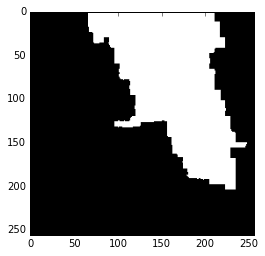

In [471]:
plt.figure()
cm = np.array([[ 0,  0,  0 ], [ 1, 1, 1 ]])
cmap = colors.ListedColormap(cm)
plt.imshow(train_img, cmap=cmap)
# plt.colorbar(ticks=[0,1,2,3,4,5])

In [472]:
import scipy

# create a 'model' for each training segment (get stats for each band)

def segment_features(segment_pixels):
    """
    For each band, compute: min, max, mean, variance, skewness, kurtosis.
    """
    features = []
    _, n_bands = segment_pixels.shape
#     print(n_bands)
    for b in range(n_bands):
        stats = scipy.stats.describe(segment_pixels[:,b])
        band_stats = list(stats.minmax) + list(stats)[2:]
        features += band_stats
    return features

In [473]:
_, _, n_bands = sample_labels.shape
n_bands

3

In [474]:
segment_ids = np.unique(segments)
# segment_ids

In [475]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
    objects = []
    objects_ids = []
    for segment_label in segment_ids:
        segment_pixels = image[segments==segment_label]
        segment_model = segment_features(segment_pixels)
        objects.append(segment_model)
        # Keep a reference to the segment label
        objects_ids.append(segment_label)  

    print("Created %i objects" % len(objects))

Created 1849 objects


In [476]:
training_labels = []
training_objects = []
for klass in classes:
    class_train_objects = [v for i, v in enumerate(objects) if objects_ids[i] in segments_per_klass[klass]]
    training_labels += [klass] * len(class_train_objects)
    print("Training samples for class %i: %i" % (klass, len(class_train_objects)))
    training_objects += class_train_objects

# # classes = [0,1]

# for klass in classes:

#     # need to get a random subset of objects?
#     class_train_objects = [v for i, v in enumerate(objects) if objects_ids[i] in segments_per_klass]
#     training_labels += [klass] * len(class_train_objects)
#     print("Training samples for class %i: %i" % (klass, len(class_train_objects)))
#     training_objects += class_train_objects

Training samples for class 0: 1304
Training samples for class 255: 655


In [477]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_jobs=-1)

In [478]:
classifier.fit(training_objects, training_labels)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=-1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)

In [479]:
predicted = classifier.predict(objects)
# np.unique(predicted)

In [480]:
clf = np.copy(segments)

In [481]:
for segment_id, klass in zip(objects_ids, predicted):
    clf[clf==segment_id] = klass
np.unique(clf)

array([  0, 255])

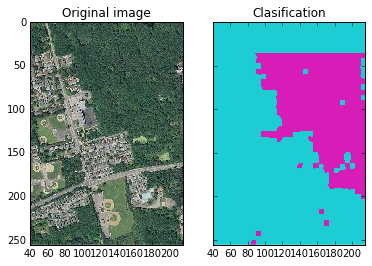

In [482]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.imshow(image, interpolation='none')
ax1.set_title('Original image')
ax2.imshow(clf, interpolation='none', cmap=colors.ListedColormap(np.random.rand(len(classes), 3)))
ax2.set_title('Classification')

### Try it on a test image

In [493]:
sample_labels_path = 'skynet-data/data/labels/color/15-9633-12334.png'
sample_labels = nd.imread(sample_labels_path)

# classes = np.unique(sample_labels)[1:]  # 0 doesn't count
classes = np.unique(sample_labels)

classes

array([  0, 255], dtype=uint8)

1849


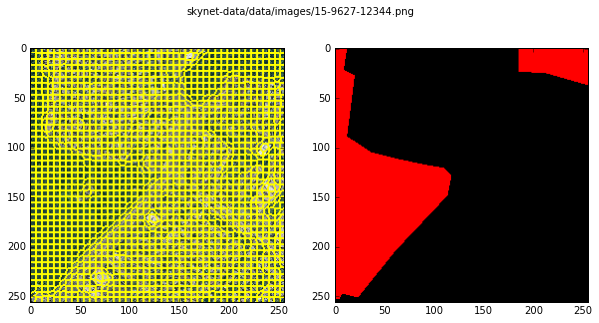

In [492]:
img_path_template = 'skynet-data/data/images/15-9633-12334.png'
label_path_template = 'skynet-data/data/labels/color/15-9633-12334.png'

image = nd.imread(img_path_template)
labels = nd.imread(label_path_template)    

fig = plt.figure(figsize=(10,5))
subplot = 121
fig.suptitle(img_path)

segments = sg.slic(image, n_segments = 2000, sigma = 4)
ax = fig.add_subplot(subplot)
ax.imshow(sg.mark_boundaries(image, segments))
subplot += 1

ax = fig.add_subplot(subplot)
ax.imshow(labels)
    
n_segments = len(np.unique(segments))
print(n_segments)

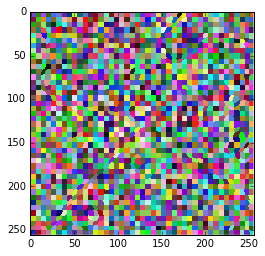

In [484]:
from matplotlib import colors

cmap = colors.ListedColormap(np.random.rand(n_segments, 3))
plt.figure()
plt.imshow(segments, interpolation='none', cmap=cmap)

In [494]:
sample_2d = sample_labels[:,:,0]
sample_2d.shape
# segments.shape

(256, 256)

In [495]:
# get number of segments in each of the two classes

segments_per_klass = {}
for klass in classes:
    segments_of_klass = segments[sample_2d==klass]
    segments_per_klass[klass] = set(segments_of_klass)
    print("Training segments for class %i: %i" % (klass, len(segments_per_klass[klass])))

# segments_of_klass = segments[sample_2d==255]
# segments_per_klass = set(segments_of_klass)
# print("Training segments for class %i: %i" % (1, len(segments_per_klass)))

Training segments for class 0: 1463
Training segments for class 255: 460


In [496]:
# segments_per_klass

In [497]:
train_img = np.copy(segments)
threshold = train_img.max() + 1
for klass in classes:
    klass_label = threshold + klass
    for segment_id in segments_per_klass[klass]:
        train_img[train_img == segment_id] = klass_label
train_img[train_img <= threshold] = 0
train_img[train_img > threshold] -= threshold

# train_img = np.copy(segments)
# threshold = train_img.max()
# klass_label = threshold + 1
# for segment_id in segments_per_klass:
#     train_img[train_img == segment_id] = klass_label
# train_img[train_img <= threshold] = 0
# train_img[train_img > threshold] -= threshold
# np.unique(train_img)

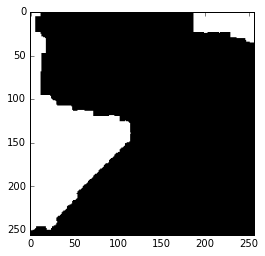

In [498]:
plt.figure()
cm = np.array([[ 0,  0,  0 ], [ 1, 1, 1 ]])
cmap = colors.ListedColormap(cm)
plt.imshow(train_img, cmap=cmap)
# plt.colorbar(ticks=[0,1,2,3,4,5])

In [499]:
import scipy

# create a 'model' for each training segment (get stats for each band)

def segment_features(segment_pixels):
    """
    For each band, compute: min, max, mean, variance, skewness, kurtosis.
    """
    features = []
    _, n_bands = segment_pixels.shape
#     print(n_bands)
    for b in range(n_bands):
        stats = scipy.stats.describe(segment_pixels[:,b])
        band_stats = list(stats.minmax) + list(stats)[2:]
        features += band_stats
    return features

In [500]:
_, _, n_bands = sample_labels.shape
n_bands

3

In [501]:
segment_ids = np.unique(segments)
# segment_ids

In [502]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
    objects = []
    objects_ids = []
    for segment_label in segment_ids:
        segment_pixels = image[segments==segment_label]
        segment_model = segment_features(segment_pixels)
        objects.append(segment_model)
        # Keep a reference to the segment label
        objects_ids.append(segment_label)  

    print("Created %i objects" % len(objects))

Created 1849 objects


In [503]:
training_labels = []
training_objects = []
for klass in classes:
    class_train_objects = [v for i, v in enumerate(objects) if objects_ids[i] in segments_per_klass[klass]]
    training_labels += [klass] * len(class_train_objects)
    print("Training samples for class %i: %i" % (klass, len(class_train_objects)))
    training_objects += class_train_objects

# # classes = [0,1]

# for klass in classes:

#     # need to get a random subset of objects?
#     class_train_objects = [v for i, v in enumerate(objects) if objects_ids[i] in segments_per_klass]
#     training_labels += [klass] * len(class_train_objects)
#     print("Training samples for class %i: %i" % (klass, len(class_train_objects)))
#     training_objects += class_train_objects

Training samples for class 0: 1463
Training samples for class 255: 460


In [504]:
predicted = classifier.predict(objects)
# np.unique(predicted)

In [505]:
clf = np.copy(segments)

In [506]:
for segment_id, klass in zip(objects_ids, predicted):
    clf[clf==segment_id] = klass
np.unique(clf)

array([  0, 255])

In [510]:
len(predicted)

1849

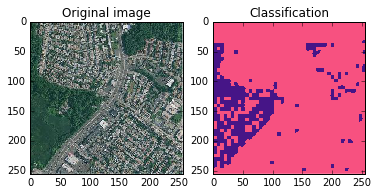

In [511]:
f, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(image, interpolation='none')
ax1.set_title('Original image')
ax2.imshow(clf, interpolation='none', cmap=colors.ListedColormap(np.random.rand(len(classes), 3)))
ax2.set_title('Classification')

In [508]:
clf[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0])